In [2]:
import networkx as nx
import osmnx as ox
import pandas as pd
import os
import geopandas as gpd
import cenpy
import geopandas as gpd
from shapely.geometry import Point
import matplotlib
#matplotlib.use('TkAgg') 
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import numpy as np
from scipy.sparse import lil_matrix
from mpl_toolkits.axes_grid1 import make_axes_locatable
from shapely.geometry import Point
import contextily as ctx
import time

In [3]:
start_time = time.time()

In [4]:
pioneer_valley = ['Hampshire County, Massachusetts, USA', 'Hampden County, Massachusetts, USA', 'Franklin County, Massachusetts, USA']
          #{'city':'Los Altos Hills', 'state':'California'},
          #'Loyola, California']
graph = ox.graph_from_place(pioneer_valley, network_type='drive')
area = ox.geocode_to_gdf(pioneer_valley)

### Road layer

In [5]:
# Retrieve nodes and edges
intxns, roads = ox.graph_to_gdfs(graph)
# 'intxns' represent intersections and endpoints as Points in a GeoDataFrame
# Set CRS for 'intxns' to ensure it matches that of public_trans_stops
intxns.crs = 'epsg:4326'

### Buildings Layer

In [6]:
buildings = ox.geometries_from_place(pioneer_valley, tags={'building':True}) # Retrieve buildings from the area:

# Display the first few rows of the data
#print(buildings.head())


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_36656\2335068275.py:1: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release.
  buildings = ox.geometries_from_place(pioneer_valley, tags={'building':True}) # Retrieve buildings from the area:


### Bridges Layer

In [7]:
# Print the current working directory to confirm where you are
#print("Current working directory:", os.getcwd())

# Change to the expected working directory if necessary
#os.chdir(r'C:\Users\Mahsa\NARS Dropbox\Projects\Equitable-Resilience\bin\python')
#print("New working directory:", os.getcwd())


In [8]:
bridges = pd.read_csv('../../data/Bridges.csv')
bridgesgpd = gpd.GeoDataFrame(bridges, geometry=gpd.points_from_xy(x=bridges.Longitude, y=bridges.Latitude))
bridgesgpd = bridgesgpd.set_crs('epsg:4326')
bridgesgpd_clipped = bridgesgpd.clip(area)

### Public transportation layer

In [9]:
public_trans_stops = ox.geometries_from_place(pioneer_valley, tags={'highway':'bus_stop','amenity':'bus_station'})
public_trans_stops.crs = 'epsg:4326'

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_36656\863768854.py:1: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release.
  public_trans_stops = ox.geometries_from_place(pioneer_valley, tags={'highway':'bus_stop','amenity':'bus_station'})


### Build multilayer network

In [10]:
# Creating Edges Between Public Transportation Stops and Roads
# In recent version of Geopandas, you can use sjoin_nearest to find the nearest points directly.

# Ensure both GeoDataFrames are in the same CRS
public_trans_stops = public_trans_stops.to_crs('epsg:4326')
intxns = intxns.to_crs('epsg:4326')

# Use sjoin_nearest (requires Geopandas 0.9 or newer)
nearest_intxns = gpd.sjoin_nearest(public_trans_stops, intxns, how='left', distance_col="distances")

# 'nearest_intxns' now contains each public transport stop matched with its nearest road intersection


C:\Users\Mahsa\anaconda3\envs\oxe\lib\site-packages\geopandas\array.py:364: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  warnings.warn(


In [11]:
# Creating Edges Between Roads to Buildings
# and intxns is a GeoDataFrame with road intersections

buildings.crs = intxns.crs  # Ensure CRS matches

nearest_intxns_to_buildings = gpd.sjoin_nearest(buildings, intxns, how='left', distance_col="distances")

# 'nearest_intxns_to_buildings' now includes each building matched with its nearest road intersection


C:\Users\Mahsa\anaconda3\envs\oxe\lib\site-packages\geopandas\array.py:364: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  warnings.warn(


In [12]:
# Creating Edges Between Roads to Bridges

bridgesgpd_clipped.crs = intxns.crs

# Find nearest road intersection for each bridge
nearest_intxns_to_bridges = gpd.sjoin_nearest(bridgesgpd_clipped, intxns, how='left', distance_col="distances")

# This adds a column to bridgesgpd_clipped with the index of the nearest road intersection from intxns


C:\Users\Mahsa\anaconda3\envs\oxe\lib\site-packages\geopandas\array.py:364: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  warnings.warn(


In [13]:
### Integrating Connections into the Multilayer Network

# Initialize the multilayer graph if not already done
MLG = nx.MultiGraph()

# For public trans stops to roads
for index, row in nearest_intxns.iterrows():
    # Assuming the index of public_trans_stops is used as the ID
    public_trans_id = row.name  # Or, row['index_left'] if the left index is preserved
    # Assuming the index of the nearest road intersection is 'index_right' from the spatial join
    nearest_road_intxn_id = row['index_right']
    # Add edge
    MLG.add_edge(public_trans_id, nearest_road_intxn_id, layer='public_trans_to_roads')


# For buildings to roads
for index, row in nearest_intxns_to_buildings.iterrows():
    building_id = row.name  # Or the specific building ID column
    nearest_road_intxn_id = row['index_right']
    MLG.add_edge(building_id, nearest_road_intxn_id, layer='buildings_to_roads')


# For bridges to roads
for index, row in nearest_intxns_to_bridges.iterrows():
    bridge_id = row.name  # Or the specific bridge ID column
    nearest_road_intxn_id = row['index_right']
    MLG.add_edge(bridge_id, nearest_road_intxn_id, layer='bridges_to_roads')

In [14]:
# Add road nodes and edges to MLG with 'roads' layer label
for u, v, data in graph.edges(data=True):
    MLG.add_node(u, layer='roads')  # Add the nodes explicitly to ensure layer assignment
    MLG.add_node(v, layer='roads')
    MLG.add_edge(u, v, layer='roads')  # Here 'layer' signifies an intra-layer connection

In [15]:
# 'intxns', 'buildings', 'bridgesgpd_clipped', and 'public_trans_stops' are your layer datasets

def add_nodes_from_gdf(gdf, layer_name):
    for idx, row in gdf.iterrows():
        # Use 'osmid' if available, otherwise fallback to the DataFrame index
        node_id = row.get('osmid', idx)
        MLG.add_node(node_id, layer=layer_name)

# Apply the function to each layer
add_nodes_from_gdf(intxns, 'roads')
add_nodes_from_gdf(buildings, 'buildings')

# Note: Ensure bridgesgpd_clipped and public_trans_stops have appropriate unique identifiers
add_nodes_from_gdf(bridgesgpd_clipped, 'bridges')
add_nodes_from_gdf(public_trans_stops, 'public_trans')


In [16]:
# Checks
print("Total nodes:", len(MLG.nodes))
print("Total edges:", len(MLG.edges))
print("Nodes by layer:", {layer: sum(1 for _, d in MLG.nodes(data=True) if d.get('layer') == layer) for layer in ['roads', 'buildings', 'bridges', 'public_trans']})
print("Inter-layer edges by layer:", {layer: sum(1 for _, _, d in MLG.edges(data=True) if d.get('layer') == layer) for layer in ['public_trans_to_roads', 'buildings_to_roads', 'bridges_to_roads']})

# Initializing dictionary for intra-layer edge counts
intra_layer_edges_count = {
    'roads': 0,  # Will be populated below
    'buildings': 0,  # No intra-layer edges expected
    'bridges': 0,  # No intra-layer edges expected
    'public_trans': 0  # No intra-layer edges expected
}

# Calculating intra-layer edges for 'roads' and confirming zero intra-layer for other layers
for u, v, data in MLG.edges(data=True):
    if data.get('layer') == 'roads':  # Assuming only 'roads' have intra-layer connections
        intra_layer_edges_count['roads'] += 1
print("Intra-layer edges by layer:", intra_layer_edges_count)

Total nodes: 371095
Total edges: 413744
Nodes by layer: {'roads': 26772, 'buildings': 340653, 'bridges': 1677, 'public_trans': 1993}
Inter-layer edges by layer: {'public_trans_to_roads': 1993, 'buildings_to_roads': 340656, 'bridges_to_roads': 1677}
Intra-layer edges by layer: {'roads': 69418, 'buildings': 0, 'bridges': 0, 'public_trans': 0}


In [17]:
import os
print(os.getcwd())

C:\Users\Mahsa\NARS Dropbox\Projects\Equitable-Resilience\bin\jupyter


### Visulize the multilayer network

In [18]:
# Data from your network, replace these with your actual values
layers = ['Roads', 'Bridges', 'Transit', 'Buildings']
node_counts = [26772, 1677, 1993, 340653]  
edge_types = ['Transit to roads', 'Transit', 'Bridges to roads']
inter_layer_counts = [1993, 340656, 1677]  
intra_layer_counts = [69418, 0, 0, 0] 

log_node_counts = [np.log(26772), np.log(1677), np.log(1993), np.log(340653)]  
log_inter_layer_counts = [np.log(1993), np.log(340656), np.log(1677)]  

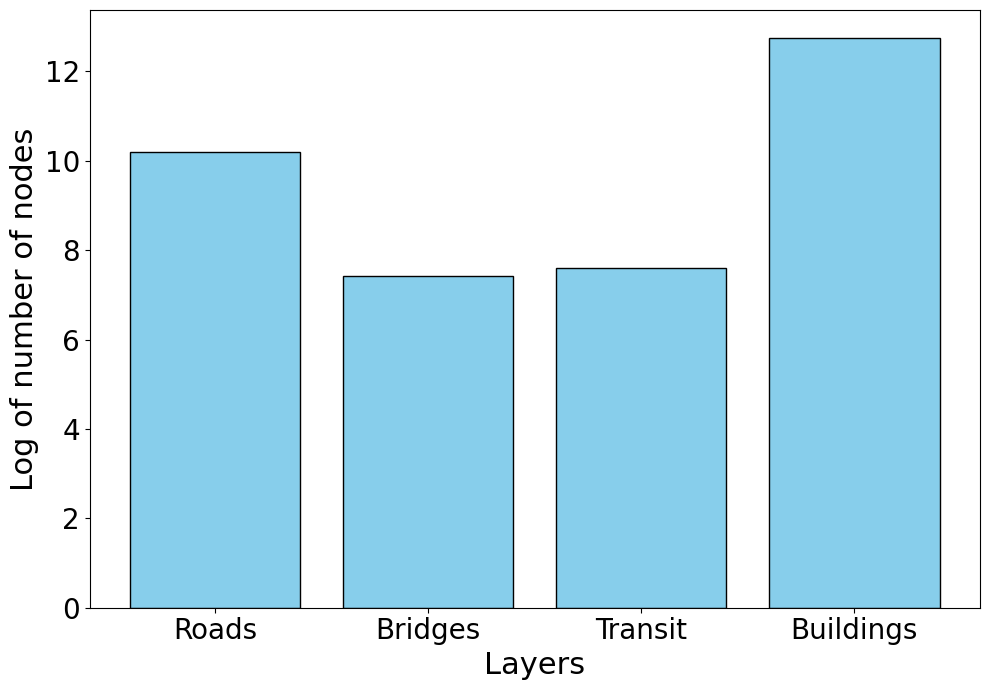

In [19]:
# Node Distribution Chart
plt.figure(figsize=(10, 7))
plt.bar(layers, log_node_counts, color='skyblue', edgecolor='black')
#plt.title('Node Distribution by Layer')
plt.xlabel('Layers', fontsize=22)
plt.ylabel('Log of number of nodes', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=20)

plt.tight_layout()
plt.savefig('nodes-distribution-by-layer.png',dpi=500)
plt.show()

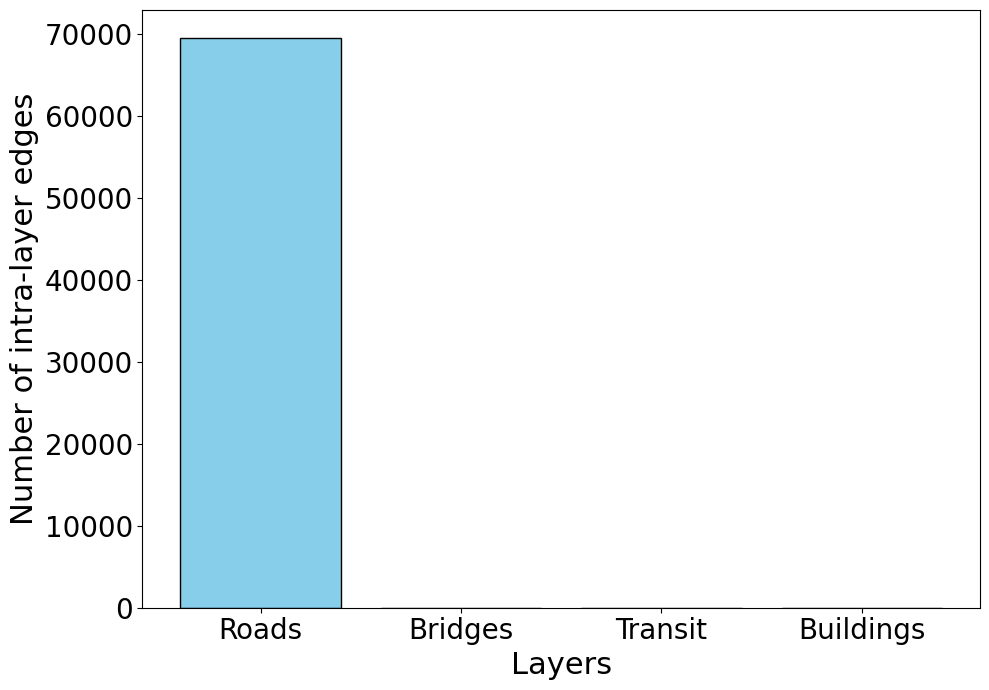

In [20]:
# Intra-layer edges Distribution Chart
plt.figure(figsize=(10, 7))
plt.bar(layers, intra_layer_counts, color='skyblue', edgecolor='black')
#plt.title('Node Distribution by Layer')
plt.xlabel('Layers', fontsize=22)
plt.ylabel('Number of intra-layer edges', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=20)

plt.tight_layout()
plt.savefig('intra-layer-distribution-by-layer.png',dpi=500)
plt.show()

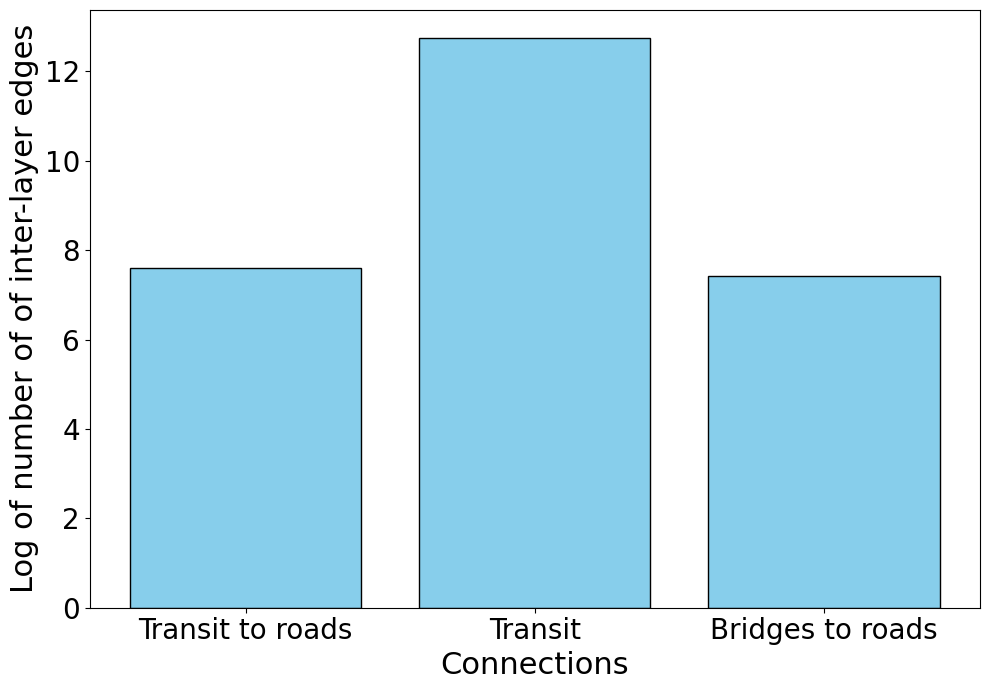

In [21]:
# Inter-layer edges Distribution Chart
plt.figure(figsize=(10, 7))
plt.bar(edge_types, log_inter_layer_counts, color='skyblue', edgecolor='black')
#plt.title('Node Distribution by Layer')
plt.xlabel('Connections', fontsize=22)
plt.ylabel('Log of number of of inter-layer edges', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=20)

plt.tight_layout()
plt.savefig('inter-layer-distribution-by-layer.png',dpi=500)

plt.show()

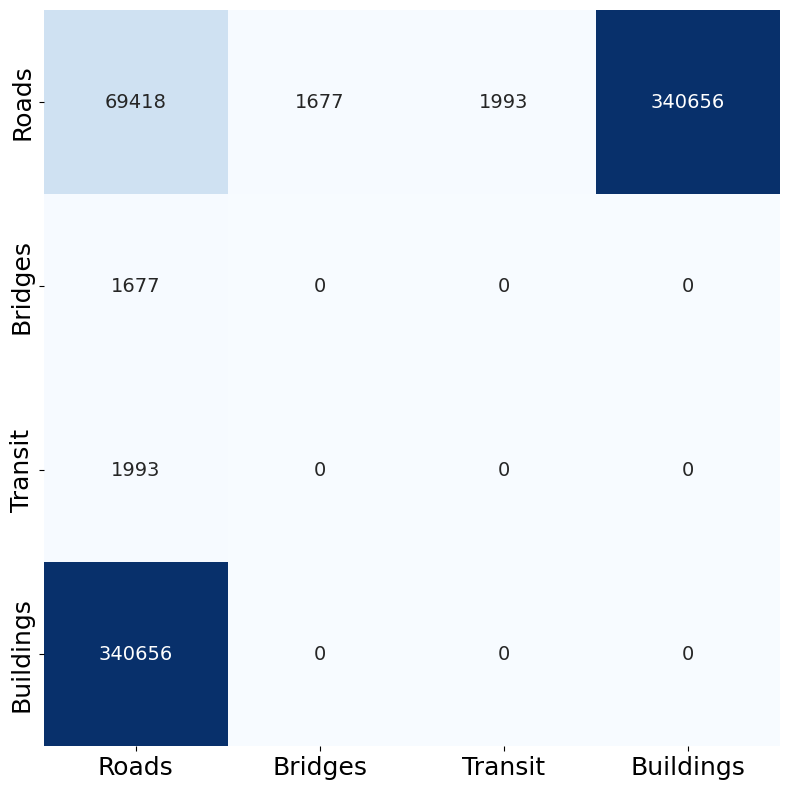

In [29]:
layer_labels = ['Roads', 'Bridges', 'Transit', 'Buildings']

layer_adj_matrix = np.array([
    [69418, 1677, 1993, 340656],  # roads to other layers
    [1677, 0, 0, 0],         # bridges to other layers
    [1993, 0, 0, 0],           # transit to other layers
    [340656, 0, 0, 0]               # buildings to other layers; note: adjust if there are values
])

# Plotting the heatmap
plt.figure(figsize=(8, 8))
ax = sns.heatmap(layer_adj_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=layer_labels, yticklabels=layer_labels,
                 annot_kws={"size": 14}, cbar=False)
#plt.title('Layer Interaction in Multilayer Network')
plt.tick_params(axis='both', which='major', labelsize=18)

# Increase colorbar tick label size
#cbar = ax.collections[0].colorbar
#cbar.ax.tick_params(labelsize=14) 

plt.tight_layout()
plt.savefig('adjacency-matrix.png',dpi=500)

plt.show()


# Multilayer resilience metrics based on the paper

## Degree in Multilayer Network


In [23]:
# Initialize a dictionary to hold the first encountered layer and degree for each node.
unique_nodes = {}

# Iterate through each node in the multilayer graph
for node, data in MLG.nodes(data=True):
    if node not in unique_nodes:  # Only add if the node hasn't been added before.
        # Initialize the degree count for this node; not differentiating by layer
        node_degree = MLG.degree(node)
        # Fetch the layer information for this node, default to 'No layer' if none specified
        node_layer = data.get('layer', 'No layer')
        # Store degree and layer in unique_nodes
        unique_nodes[node] = {'degree': node_degree, 'layer': node_layer}

# Convert the unique_nodes dictionary to a DataFrame
degree_df = pd.DataFrame([(node, info['degree'], info['layer']) for node, info in unique_nodes.items()], columns=['osmid', 'degree', 'layer'])

# Clean up 'osmid' column to ensure it contains only numeric IDs
degree_df['osmid'] = degree_df['osmid'].apply(lambda x: x if isinstance(x, int) else x[1] if isinstance(x, tuple) else x)

# Now 'degree_df' contains 'osmid', 'degree', and 'layer' for each node, with each node listed once.
degree_df

,osmid,degree,layer
0,63015861,1,public_trans
1,63015861,11,roads
2,65475629,1,public_trans
3,65475629,5,roads
4,1408370523,1,public_trans
...,...,...,...
371090,11495744004,3,roads
371091,11495744009,4,roads
371092,11495744006,3,roads
371093,11495744013,3,roads


## Overlapping Degree


In [24]:
# Initialize dictionary to hold overlapping degrees
overlapping_degrees = {node: 0 for node in MLG.nodes()}

# Iterate through each node, counting unique neighbors across layers
for node in MLG.nodes():
    unique_neighbors = set()
    for layer in MLG.nodes[node].get('layers', []):  # Assuming each node knows its layers
        layer_neighbors = set(MLG[node])  # Direct neighbors in the current layer
        unique_neighbors.update(layer_neighbors)
    overlapping_degrees[node] = len(unique_neighbors)
overlapping_degrees_df = pd.DataFrame(list(overlapping_degrees.items()), columns=['osmid', 'overlapping_degree'])

# Clean up 'osmid' column
overlapping_degrees_df['osmid'] = overlapping_degrees_df['osmid'].apply(lambda x: x[1] if isinstance(x, tuple) else x)

overlapping_degrees_df['overlapping_degree'].unique()

array([0], dtype=int64)

## PageRank

PageRank can be considered a resilience metric for a multilayer network, especially in contexts where the importance or influence of nodes across different layers is relevant. In multilayer networks, PageRank can help identify key nodes that, if disrupted, might significantly impact the overall network connectivity and information flow.

While traditional PageRank was designed for single-layer networks, like web page rankings, its concept can be extended to multilayer networks by considering inter-layer links and treating each instance of a node in different layers as distinct for the purpose of the calculation.

However, directly applying PageRank in a multilayer context using standard tools requires flattening the network or treating it as a single-layer network for the purpose of the calculation. If your multilayer network MLG has been structured with clear layer attributes, and you're interested in assessing node importance across the entire structure, here is how you could calculate PageRank using NetworkX:

In [25]:
# Compute PageRank for the entire multilayer network
pagerank_scores = nx.pagerank(MLG)

# Initialize a structure to hold PageRank scores, organized by layer
pagerank_by_layer = {'roads': {}, 'bridges': {}, 'public_trans': {}, 'buildings': {}, 'No layer': {}}

# Assign PageRank scores to the appropriate layer
for node, score in pagerank_scores.items():
    # Fetch the layer attribute; default to 'No layer' if not present
    node_layer = MLG.nodes[node].get('layer', 'No layer')
    pagerank_by_layer[node_layer][node] = score
    
# Here begins the new code for creating the DataFrame
# List to hold node, PageRank score, and layer information
pagerank_list = []

# Iterate through each layer in pagerank_by_layer
for layer, nodes in pagerank_by_layer.items():
    for node, score in nodes.items():
        # Append node, score, and layer information to the list
        pagerank_list.append((node, score, layer))

# Convert the list to a DataFrame
pagerank_df = pd.DataFrame(pagerank_list, columns=['osmid', 'pagerank', 'layer'])

# If 'osmid' values are tuples or have extra text, clean them up
pagerank_df['osmid'] = pagerank_df['osmid'].apply(lambda x: x if isinstance(x, int) else x[1])

# Now pagerank_df contains the PageRank scores, organized by layer
pagerank_df

,osmid,pagerank,layer
0,63015861,0.000009,roads
1,65475629,0.000006,roads
2,65455296,0.000011,roads
3,62987293,0.000010,roads
4,62992157,0.000018,roads
...,...,...,...
371090,15429772,0.000001,buildings
371091,15429773,0.000001,buildings
371092,16947706,0.000001,buildings
371093,16947707,0.000001,buildings


Network Size: In very large networks, it's common for individual nodes to have small PageRank values because the probability distribution is spread over many nodes. The total sum of PageRank scores in the network should be 1. If your network (MLG) contains a large number of nodes, small PageRank values for each node might be expected.

In [26]:
# Summing up all PageRank scores
total_pagerank_sum = sum(pagerank_scores.values())

print("Total sum of PageRank scores:", total_pagerank_sum)


Total sum of PageRank scores: 0.9999999999999019


In [27]:
end_time = time.time()
print(f"Execution time: {end_time - start_time} seconds")

Execution time: 318.8197865486145 seconds


# Visulaize computed metrics

In [32]:
### Asign degrees
for node in MLG.nodes():
    MLG.nodes[node]['degree'] = MLG.degree(node)

In [33]:
# Assign PageRank values to nodes
# Compute PageRank values for each node in the graph
pagerank_values = nx.pagerank(MLG)

for node, pr_value in pagerank_values.items():
    MLG.nodes[node]['pagerank'] = pr_value

In [34]:
# Assign overlapping_degree values to nodes
overlapping_degree = {node: sum(1 for _ in MLG.edges(node, data=True) if _[2].get('layer')) for node in MLG.nodes()}
for node in MLG.nodes():
    MLG.nodes[node]['overlapping_degree'] = overlapping_degree[node]

In [35]:
#closeness_centrality = nx.closeness_centrality(MLG)
#for node in MLG.nodes():
#    MLG.nodes[node]['closeness'] = closeness_centrality.get(node, 0)

In [36]:
#betweenness_centrality = nx.betweenness_centrality(MLG)
#for node in MLG.nodes():
#    MLG.nodes[node]['betweenness'] = betweenness_centrality.get(node, 0)

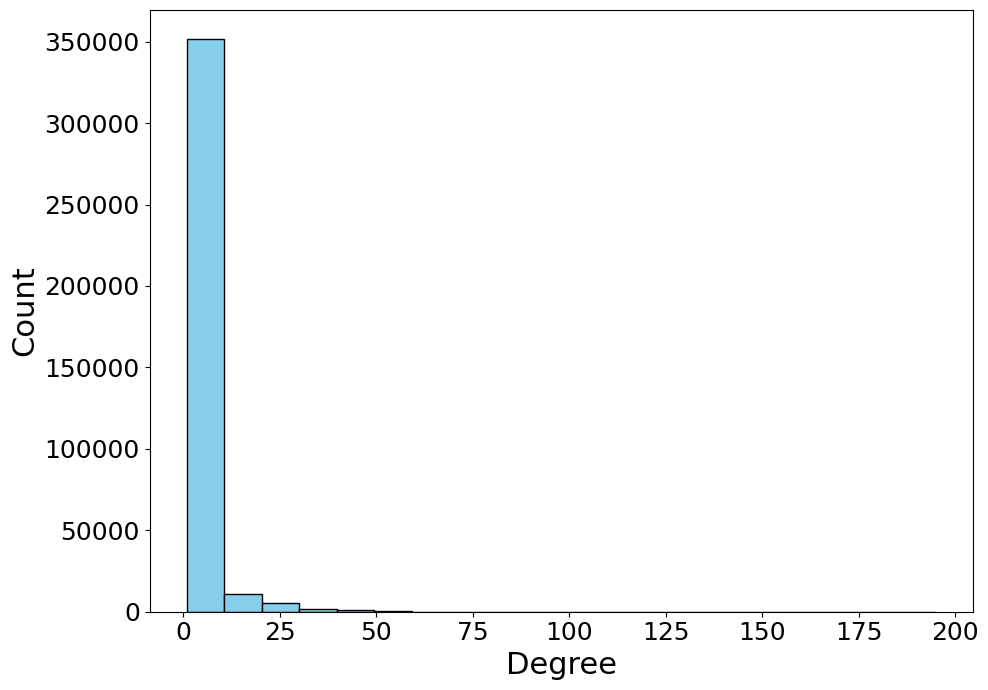

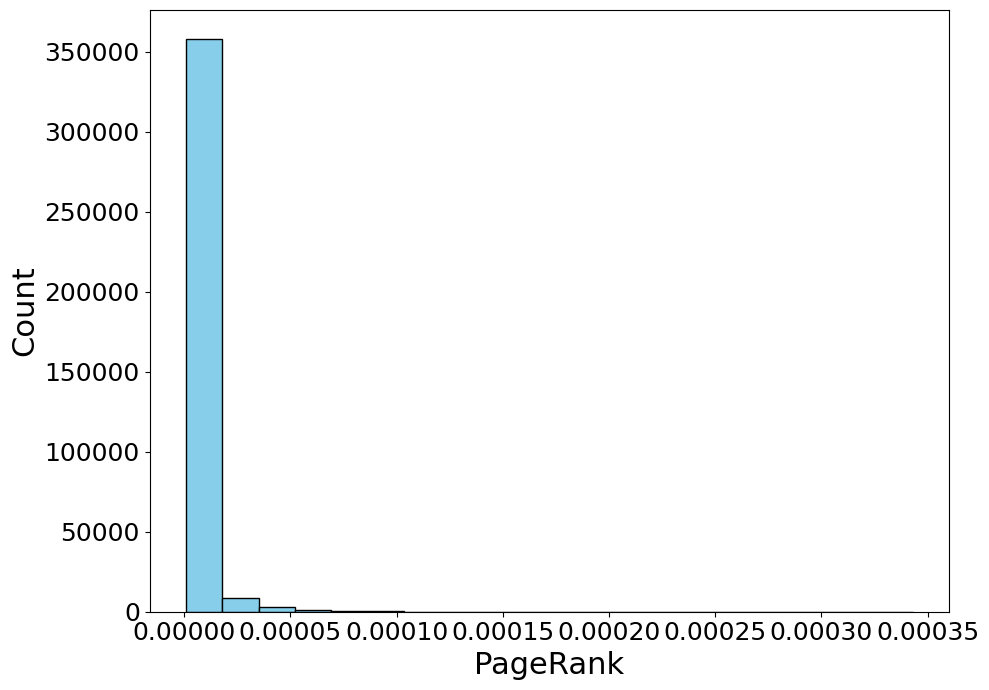

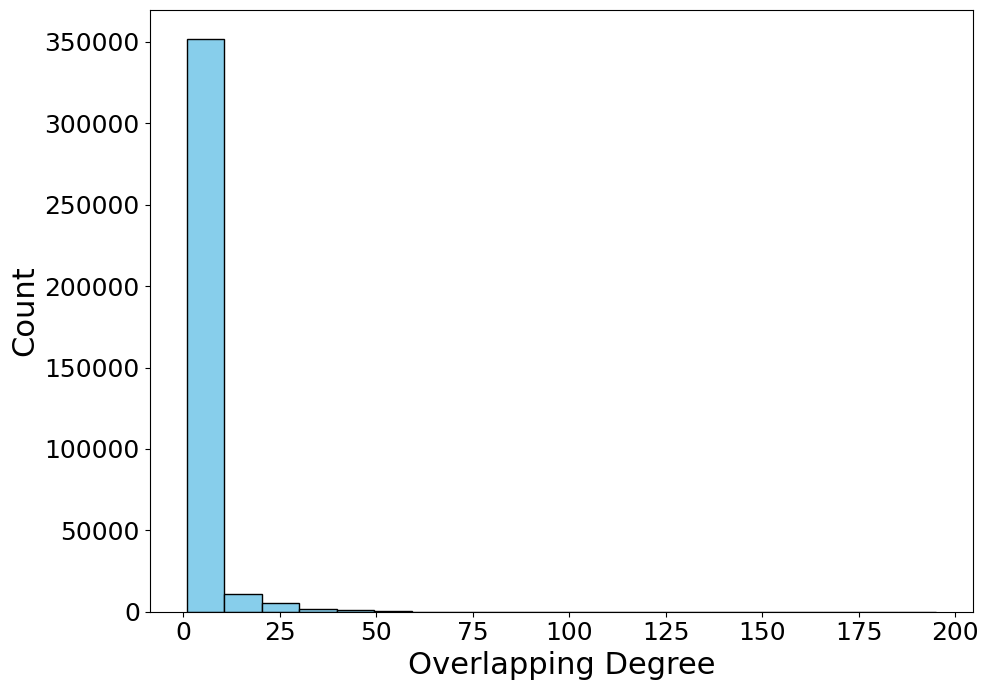

In [37]:
metrics = ['degree', 'pagerank', 'overlapping_degree']
titles = ['Degree', 'PageRank', 'Overlapping Degree']  # Corresponding titles for each metric

for metric, title in zip(metrics, titles):  # Pair each metric with its title
    values = [MLG.nodes[node][metric] for node in MLG.nodes() if metric in MLG.nodes[node]]
    plt.figure(figsize=(10, 7))
    plt.hist(values, bins=20, color='skyblue', edgecolor='black')
    plt.xlabel(title, fontsize=22)  # Use the formatted title here
    plt.ylabel('Count', fontsize=22)
    plt.tick_params(axis='both', which='major', labelsize=18)

    plt.tight_layout()
    plt.savefig(f'{metric}-hist.png', dpi=500)  # Save using the metric name
    plt.show()


In [38]:
#Generate the Graph with OSMnx
pioneer_valley = ['Hampshire County, Massachusetts, USA', 'Hampden County, Massachusetts, USA', 'Franklin County, Massachusetts, USA']
          #{'city':'Los Altos Hills', 'state':'California'},
          #'Loyola, California']
graph = ox.graph_from_place(pioneer_valley, network_type='drive')
pv_nodes, pv_streets  = ox.graph_to_gdfs(graph)

# Convert the graph to GeoDataFrames
nodes_gdf, edges_gdf = ox.graph_to_gdfs(graph)

# Convert node degree view to DataFrame
nodes_degree = pd.DataFrame(graph.degree(), columns=['osmid', 'degree'])

# Reset index to make 'osmid' a column
nodes_gdf.reset_index(inplace=True)

# Merge the degree information with nodes GeoDataFrame
merged_nodes_gdf = pd.merge(nodes_gdf, nodes_degree, on='osmid')

In [39]:
#Merging Geographic Data into the Multilayer Network

# Loop through the merged_nodes_gdf to assign data to MLG
for _, row in merged_nodes_gdf.iterrows():
    node_id = row['osmid']  # OSM ID
    if node_id in MLG:
        MLG.nodes[node_id]['x'] = row['x']  # Longitude
        MLG.nodes[node_id]['y'] = row['y']  # Latitude
        #MLG.nodes[node_id]['degree'] = row['degree']
    else:
        # Handle the case where a node might not exist in MLG
        print(f"Node {node_id} not found in MLG")


In [40]:
# Create histograms of the computed metrics
#fig, axs = plt.subplots(2, 2, figsize=(14, 10))
#metrics = ['degree', 'pagerank', 'betweenness', 'closeness', 'eigenvector', 'clustering']
#titles = ['Degree', 'PageRank', 'Betweenness Centrality', 'Closeness Centrality', 'Eigenvector Centrality', 'Clustering Coefficient']
#for ax, metric, title in zip(axs.flatten(), metrics, titles):
#    values = [MLG.nodes[node][metric] for node in MLG.nodes() if metric in MLG.nodes[node]]
#    ax.hist(values, bins=20, color='skyblue', edgecolor='black')
#    ax.set_title(title)
#    ax.set_xlabel(metric)
#    ax.set_ylabel('Count')

#plt.tight_layout()
#plt.savefig(f'{title}-hist.png', dpi=500)
#plt.show()

In [41]:
#from itertools import islice

# Print attributes of the first 5 nodes
#for node, attrs in islice(MLG.nodes(data=True), 5):
#    print(f"Node: {node}, Attributes: {attrs}")

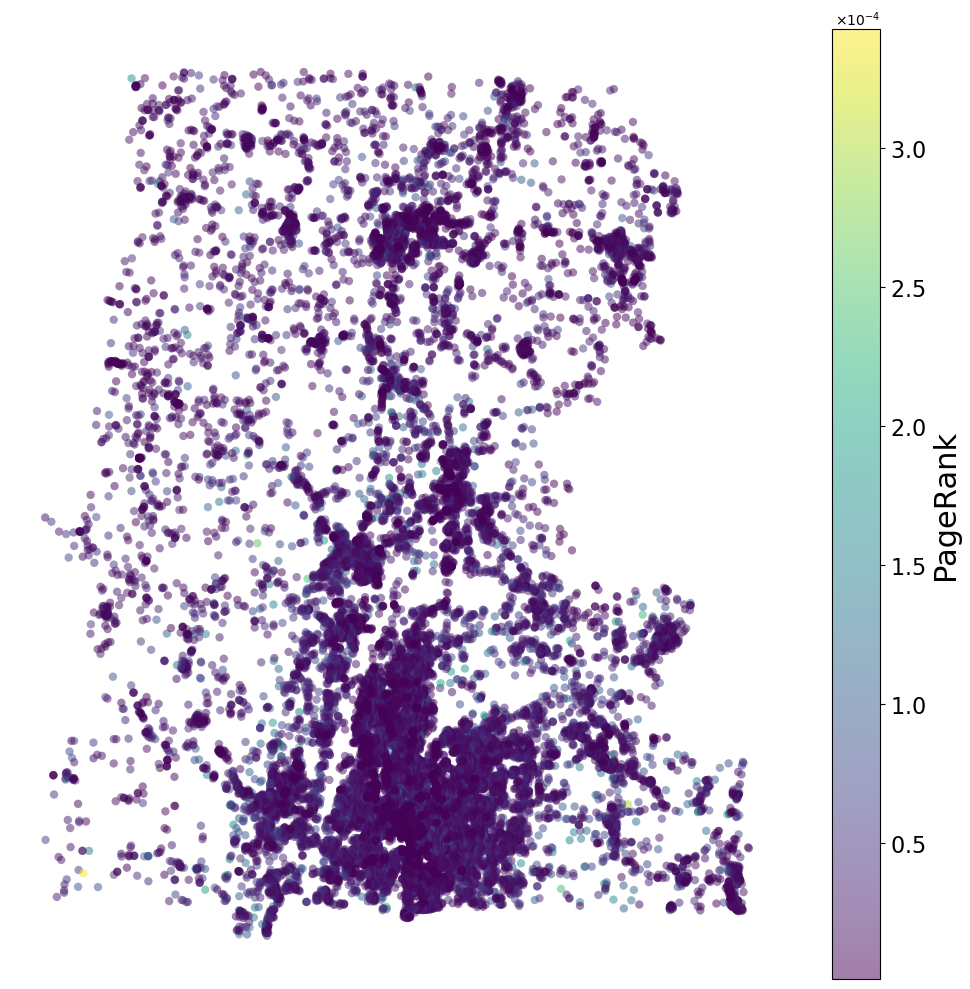

In [42]:
import matplotlib.colors as mcolors
from matplotlib.ticker import ScalarFormatter


# Filter for nodes in the 'roads' layer and extract data for plotting
nodes_data = [{
    'id': node,
    'x': MLG.nodes[node]['x'],  # Use 'x' for longitude
    'y': MLG.nodes[node]['y'],  # Use 'y' for latitude
    'pagerank': MLG.nodes[node]['pagerank'],
    'layer': MLG.nodes[node].get('layer', 'undefined')
} for node in MLG.nodes() if MLG.nodes[node].get('layer') == 'roads']

# Create a DataFrame from the nodes data
nodes_df = pd.DataFrame(nodes_data)

# Ensure DataFrame is for the 'roads' layer only
roads_df = nodes_df[nodes_df['layer'] == 'roads']  # This should be redundant now but keeps your code clear

# Normalizing PageRank values for color mapping
pageranks = roads_df['pagerank'].values
norm = mcolors.Normalize(vmin=pageranks.min(), vmax=pageranks.max())
cmap = plt.cm.viridis  # Colormap for PageRank

# Plotting using geographic coordinates (using 'x' and 'y')
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(roads_df['x'], roads_df['y'], c=roads_df['pagerank'], cmap=cmap, norm=norm, alpha=0.5, linewidth=.25, edgecolors='none')

# Create colorbar based on PageRank
cbar = fig.colorbar(scatter, ax=ax)

# Set the colorbar labels to scientific notation using ScalarFormatter
formatter = ScalarFormatter(useMathText=True)  # Enables scientific notation
formatter.set_scientific(True)
formatter.set_powerlimits((-3, 4))  # Adjust range for scientific notation if necessary
cbar.ax.yaxis.set_major_formatter(formatter)  # Apply formatter to the colorbar

cbar.set_label('PageRank', fontsize=22)

# Increase font size for the ticks
cbar.ax.tick_params(labelsize=16)


# Increase font size for the ticks
cbar.ax.tick_params(labelsize=16)

# Final touches to the plot
#ax.set_title('Roads Layer Visualization with Node PageRank on Geographic Map')
ax.axis('off')  # Turn off the axis
plt.tight_layout()  # Adjust the layout
plt.savefig('ML-.png',dpi=120)
plt.show()  # Display the plot

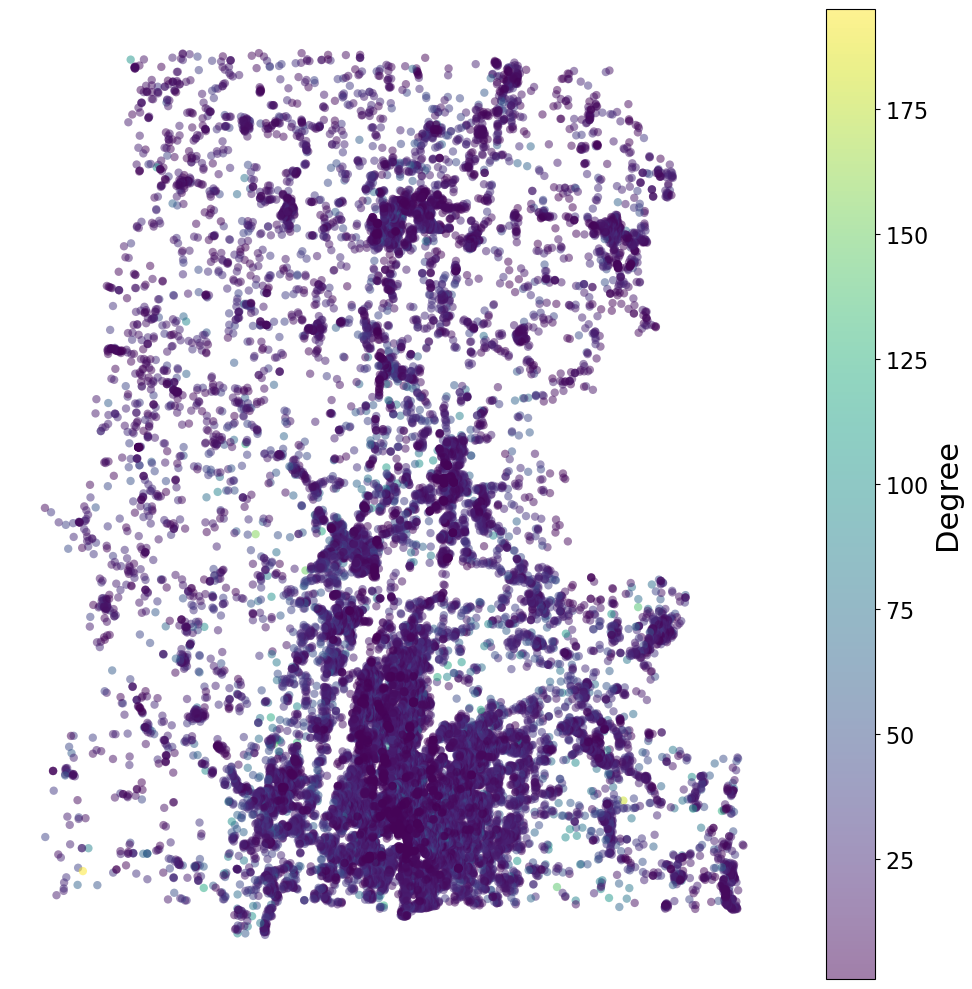

In [43]:
# Filter for nodes in the 'roads' layer and extract data for plotting
nodes_data = [{
    'id': node,
    'x': MLG.nodes[node]['x'],  # Use 'x' for longitude
    'y': MLG.nodes[node]['y'],  # Use 'y' for latitude
    'degree': MLG.nodes[node]['degree'],
    'layer': MLG.nodes[node].get('layer', 'undefined')
} for node in MLG.nodes() if MLG.nodes[node].get('layer') == 'roads']

# Create a DataFrame from the nodes data
nodes_df = pd.DataFrame(nodes_data)

# Ensure DataFrame is for the 'roads' layer only
roads_df = nodes_df[nodes_df['layer'] == 'roads']  # This should be redundant now but keeps your code clear

# Normalizing PageRank values for color mapping
pageranks = roads_df['degree'].values
norm = mcolors.Normalize(vmin=pageranks.min(), vmax=pageranks.max())
cmap = plt.cm.viridis  # Colormap for PageRank

# Plotting using geographic coordinates (using 'x' and 'y')
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(roads_df['x'], roads_df['y'], c=roads_df['degree'], cmap=cmap, norm=norm, alpha=0.5, edgecolors='none')

# Create colorbar based on PageRank
cbar = fig.colorbar(scatter, ax=ax)

# Set the colorbar labels to scientific notation using ScalarFormatter
formatter = ScalarFormatter(useMathText=True)  # Enables scientific notation
formatter.set_scientific(True)
formatter.set_powerlimits((-3, 4))  # Adjust range for scientific notation if necessary
cbar.ax.yaxis.set_major_formatter(formatter)  # Apply formatter to the colorbar

cbar.set_label('Degree', fontsize=22)

# Increase font size for the ticks
cbar.ax.tick_params(labelsize=16)

# Final touches to the plot
#ax.set_title('Roads Layer Visualization with Node PageRank on Geographic Map')
ax.axis('off')  # Turn off the axis
plt.tight_layout()  # Adjust the layout
plt.savefig('ML-degree.png',dpi=120)
plt.show()  # Display the plot

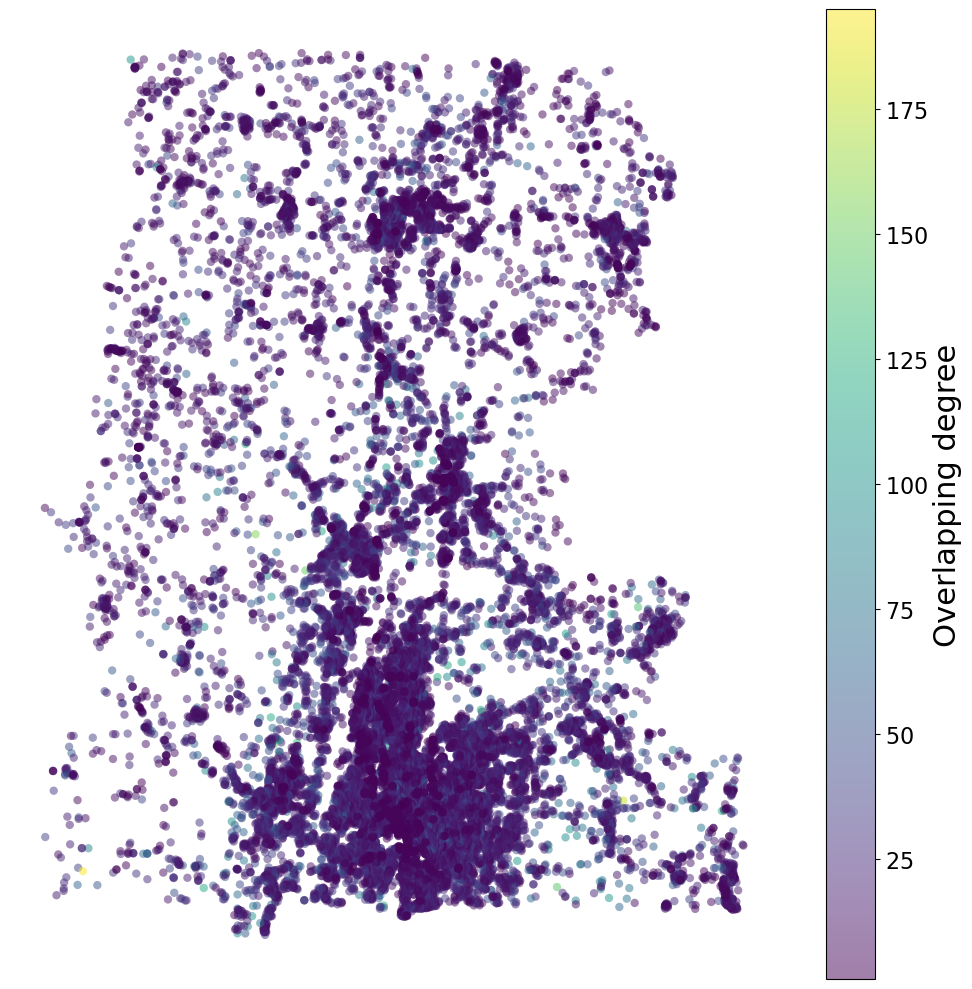

In [44]:
# Filter for nodes in the 'roads' layer and extract data for plotting
nodes_data = [{
    'id': node,
    'x': MLG.nodes[node]['x'],  # Use 'x' for longitude
    'y': MLG.nodes[node]['y'],  # Use 'y' for latitude
    'overlapping_degree': MLG.nodes[node]['overlapping_degree'],
    'layer': MLG.nodes[node].get('layer', 'undefined')
} for node in MLG.nodes() if MLG.nodes[node].get('layer') == 'roads']

# Create a DataFrame from the nodes data
nodes_df = pd.DataFrame(nodes_data)

# Ensure DataFrame is for the 'roads' layer only
roads_df = nodes_df[nodes_df['layer'] == 'roads']  # This should be redundant now but keeps your code clear

# Normalizing PageRank values for color mapping
pageranks = roads_df['overlapping_degree'].values
norm = mcolors.Normalize(vmin=pageranks.min(), vmax=pageranks.max())
cmap = plt.cm.viridis  # Colormap for PageRank

# Plotting using geographic coordinates (using 'x' and 'y')
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(roads_df['x'], roads_df['y'], c=roads_df['overlapping_degree'], cmap=cmap, norm=norm, alpha=0.5, edgecolors='none')

# Create colorbar based on PageRank
cbar = fig.colorbar(scatter, ax=ax)

# Set the colorbar labels to scientific notation using ScalarFormatter
formatter = ScalarFormatter(useMathText=True)  # Enables scientific notation
formatter.set_scientific(True)
formatter.set_powerlimits((-3, 4))  # Adjust range for scientific notation if necessary
cbar.ax.yaxis.set_major_formatter(formatter)  # Apply formatter to the colorbar

cbar.set_label('Overlapping degree', fontsize=22)

# Increase font size for the ticks
cbar.ax.tick_params(labelsize=16)

# Final touches to the plot
#ax.set_title('Roads Layer Visualization with Node PageRank on Geographic Map')
ax.axis('off')  # Turn off the axis
plt.tight_layout()  # Adjust the layout
plt.savefig('ML-overlapping_degree.png',dpi=120)
plt.show()  # Display the plot

In [45]:
pagerank_df

,osmid,pagerank,layer
0,63015861,0.000009,roads
1,65475629,0.000006,roads
2,65455296,0.000011,roads
3,62987293,0.000010,roads
4,62992157,0.000018,roads
...,...,...,...
371090,15429772,0.000001,buildings
371091,15429773,0.000001,buildings
371092,16947706,0.000001,buildings
371093,16947707,0.000001,buildings


# Equity weighting

## Extract required information from cenpy

In [46]:
acs = cenpy.products.ACS(2017)

variables = ['B01003_001E', 'B19025A_001E', 'B15003_001E']
variables_info = acs.variables.loc[variables]

for variable in variables:
    print(f"{variable}:")
    print(f"  Label: {variables_info.loc[variable, 'label']}")
    print(f"  Concept: {variables_info.loc[variable, 'concept']}")
    print()

B01003_001E:
  Label: Estimate!!Total
  Concept: TOTAL POPULATION

B19025A_001E:
  Label: Estimate!!Aggregate household income in the past 12 months (in 2017 inflation-adjusted dollars)
  Concept: AGGREGATE HOUSEHOLD INCOME IN THE PAST 12 MONTHS (IN 2017 INFLATION-ADJUSTED DOLLARS) (WHITE ALONE HOUSEHOLDER)

B15003_001E:
  Label: Estimate!!Total
  Concept: EDUCATIONAL ATTAINMENT FOR THE POPULATION 25 YEARS AND OVER



In [47]:
#spfld_msa_demog = cenpy.products.ACS(2017).from_msa('Springfield, MA', variables=['B01001_001E','B19025A_001E','B01002_001E'])
# B01003_001E: population (total, and by age (gender))
# B19025: income levels (in 2017 inflation-adjusted dollars)
hampshire_demog = acs.from_county(county='Hampshire, MA', variables=variables)
hampden_demog = acs.from_county(county='Hampden, MA', variables=variables)
franklin_demog = acs.from_county(county='Franklin, MA', variables=variables)

# Built demographic variables variables
hampshire_demog['population_density_psqkm'] = 1000000*hampshire_demog['B01003_001E']/hampshire_demog.area
hampden_demog['population_density_psqkm'] = 1000000*hampden_demog['B01003_001E']/hampden_demog.area
franklin_demog['population_density_psqkm'] = 1000000*franklin_demog['B01003_001E']/franklin_demog.area
pv_demog = pd.concat([hampshire_demog, hampden_demog, franklin_demog])



pv_demog['inverse_income'] = 1 / pv_demog['B19025A_001E']
pv_demog['educational_attainment'] = 1 / pv_demog['B15003_001E']


# Normalize the variables
pv_demog['normalized_population_density'] = (pv_demog['population_density_psqkm']-pv_demog['population_density_psqkm'].min()) / (pv_demog['population_density_psqkm'].max()-pv_demog['population_density_psqkm'].min())
pv_demog['normalized_inverse_income'] = (pv_demog['inverse_income']-pv_demog['inverse_income'].min()) / (pv_demog['inverse_income'].max()-pv_demog['inverse_income'].min())
pv_demog['normalized_educational_attainment'] = (pv_demog['educational_attainment']-pv_demog['educational_attainment'].min()) / (pv_demog['educational_attainment'].max()-pv_demog['educational_attainment'].min())

C:\Users\Mahsa\anaconda3\envs\oxe\lib\site-packages\cenpy\products.py:762: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  return self._from_name(county, variables, level, "Counties", **kwargs)
C:\Users\Mahsa\anaconda3\envs\oxe\lib\site-packages\cenpy\products.py:762: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  return self._from_name(county, variables, level, "Counties", **kwargs)
C:\Users\Mahsa\anaconda3\envs\oxe\lib\site-packages\cenpy\products.py:762: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  return self._from_name(county, variables, level, "Counties", **kwargs)


## Merge the socieconomic data into the multilayer network

In [48]:
nodes_data = [{
    'id': node,
    'x': MLG.nodes[node]['x'],  # Use 'x' for longitude
    'y': MLG.nodes[node]['y'],  # Use 'y' for latitude
    'degree': MLG.nodes[node]['degree'],
    'overlapping_degree': MLG.nodes[node]['overlapping_degree'],
    'pagerank': MLG.nodes[node]['pagerank'],
    'layer': MLG.nodes[node].get('layer', 'undefined')
} for node in MLG.nodes() if MLG.nodes[node].get('layer') == 'roads']

In [49]:
nodes_df = pd.DataFrame(nodes_data)

# Create a GeoDataFrame from nodes_df
gdf_nodes = gpd.GeoDataFrame(nodes_df, geometry=[Point(xy) for xy in zip(nodes_df.x, nodes_df.y)], crs="EPSG:4326")

# Ensure CRS alignment
pv_demog = pv_demog.to_crs(gdf_nodes.crs)

# Performing the spatial join
merged_pv_nodes = gpd.sjoin(gdf_nodes, pv_demog, how="left", op='intersects')

C:\Users\Mahsa\anaconda3\envs\oxe\lib\site-packages\IPython\core\interactiveshell.py:3400: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [50]:
merged_pv_nodes.head()

,id,x,y,degree,overlapping_degree,pagerank,layer,geometry,index_right,GEOID,...,NAME,state,county,tract,population_density_psqkm,inverse_income,educational_attainment,normalized_population_density,normalized_inverse_income,normalized_educational_attainment
0,63015861,-72.610664,42.201988,11,11,0.000009,roads,POINT (-72.61066 42.20199),24.0,25013811600,...,"Census Tract 8116, Hampden County, Massachusetts",25,013,811600,2248.749392,3.218808e-08,0.000561,0.653200,0.063066,0.004755
1,65475629,-72.660442,42.059548,5,5,0.000006,roads,POINT (-72.66044 42.05955),71.0,25013813205,...,"Census Tract 8132.05, Hampden County, Massachu...",25,013,813205,150.818780,4.307539e-09,0.000179,0.042245,0.002803,0.000170
2,65455296,-72.658821,42.054518,12,12,0.000011,roads,POINT (-72.65882 42.05452),71.0,25013813205,...,"Census Tract 8132.05, Hampden County, Massachu...",25,013,813205,150.818780,4.307539e-09,0.000179,0.042245,0.002803,0.000170
3,62987293,-72.610568,42.205327,11,11,0.000010,roads,POINT (-72.61057 42.20533),25.0,25013811700,...,"Census Tract 8117, Hampden County, Massachusetts",25,013,811700,1016.369040,4.703116e-08,0.000617,0.294309,0.095149,0.005433
4,62992157,-72.616820,42.208707,16,16,0.000018,roads,POINT (-72.61682 42.20871),36.0,25013811800,...,"Census Tract 8118, Hampden County, Massachusetts",25,013,811800,3001.833946,1.548839e-08,0.000388,0.872512,0.026970,0.002676


In [51]:
#Create the 'income_weight' and 'population_weight' columns
merged_pv_nodes['weighted_degree_income'] = merged_pv_nodes['normalized_inverse_income'] * merged_pv_nodes['degree']
merged_pv_nodes['weighted_degree_popden'] = merged_pv_nodes['normalized_population_density'] * merged_pv_nodes['degree']
merged_pv_nodes['weighted_degree_education'] = merged_pv_nodes['normalized_educational_attainment'] * merged_pv_nodes['degree']
merged_pv_nodes['weighted_degree_income_popdens_education'] = 0.33333333333*merged_pv_nodes['normalized_inverse_income']* merged_pv_nodes['degree']+0.33333333333*merged_pv_nodes['normalized_population_density'] * merged_pv_nodes['degree']+0.33333333333*merged_pv_nodes['normalized_educational_attainment'] * merged_pv_nodes['degree']

merged_pv_nodes['weighted_overlapping_degree_income'] = merged_pv_nodes['normalized_inverse_income'] * merged_pv_nodes['overlapping_degree']
merged_pv_nodes['weighted_overlapping_degree_popden'] = merged_pv_nodes['normalized_population_density'] * merged_pv_nodes['overlapping_degree']
merged_pv_nodes['weighted_overlapping_degree_education'] = merged_pv_nodes['normalized_educational_attainment'] * merged_pv_nodes['overlapping_degree']
merged_pv_nodes['weighted_overlapping_degree_income_popdens_education'] = 0.33333333333*merged_pv_nodes['normalized_inverse_income']* merged_pv_nodes['overlapping_degree']+0.33333333333*merged_pv_nodes['normalized_population_density'] * merged_pv_nodes['overlapping_degree']+0.33333333333*merged_pv_nodes['normalized_educational_attainment'] * merged_pv_nodes['overlapping_degree']

merged_pv_nodes['weighted_pagerank_income'] = merged_pv_nodes['normalized_inverse_income'] * merged_pv_nodes['pagerank']
merged_pv_nodes['weighted_pagerank_popden'] = merged_pv_nodes['normalized_population_density'] * merged_pv_nodes['pagerank']
merged_pv_nodes['weighted_pagerank_education'] = merged_pv_nodes['normalized_educational_attainment'] * merged_pv_nodes['pagerank']
merged_pv_nodes['weighted_pagerank_income_popdens_education'] = 0.33333333333*merged_pv_nodes['normalized_inverse_income']* merged_pv_nodes['pagerank']+0.33333333333*merged_pv_nodes['normalized_population_density'] * merged_pv_nodes['pagerank']+0.33333333333*merged_pv_nodes['normalized_educational_attainment'] * merged_pv_nodes['pagerank']


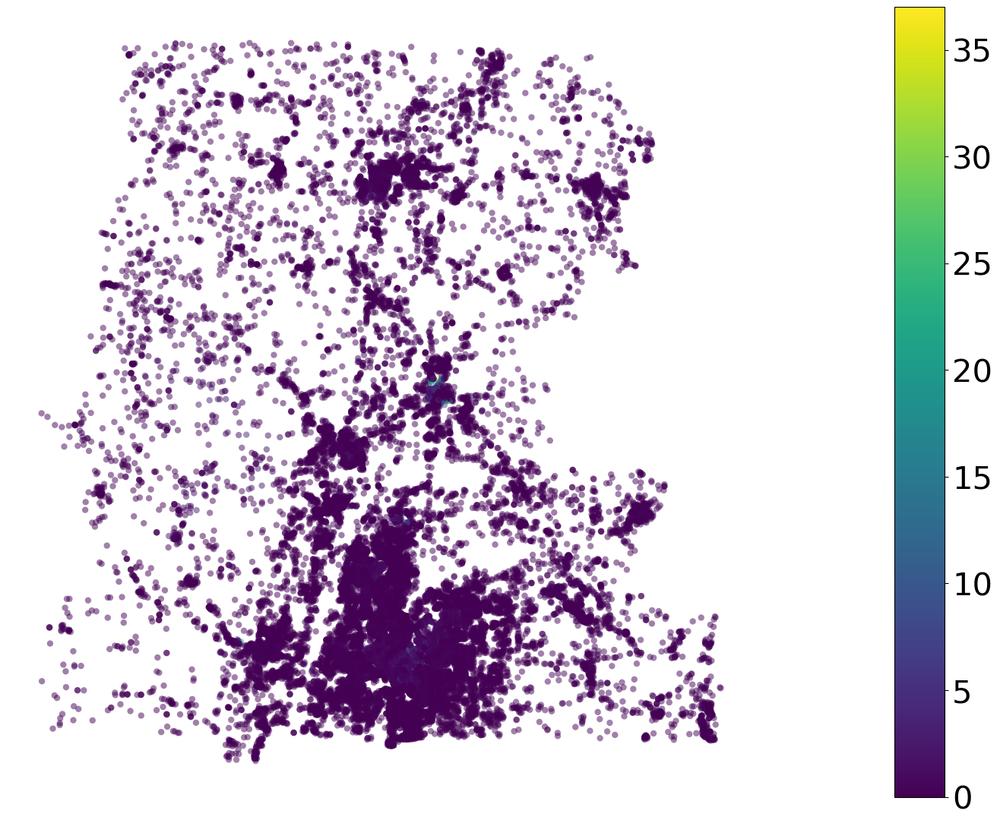

In [52]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('weighted_degree_income', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-income-equity-weighted-node-degree.png',dpi=120)

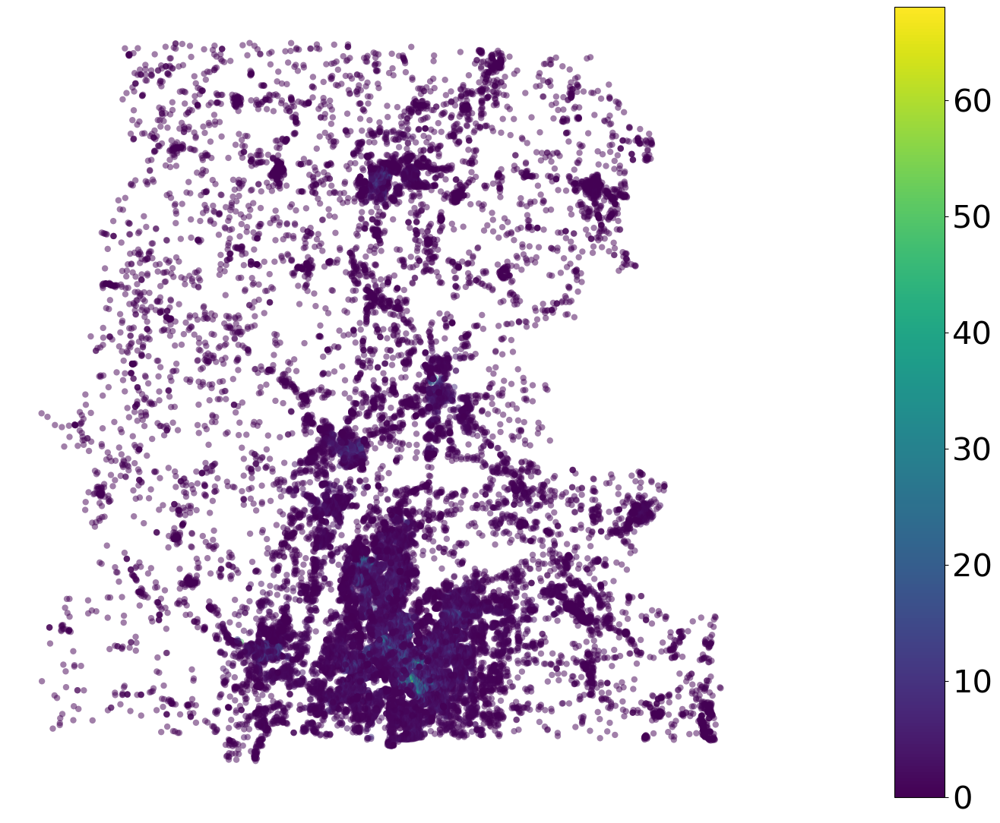

In [53]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('weighted_degree_popden', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-popden-equity-weighted-node-degree.png',dpi=120)

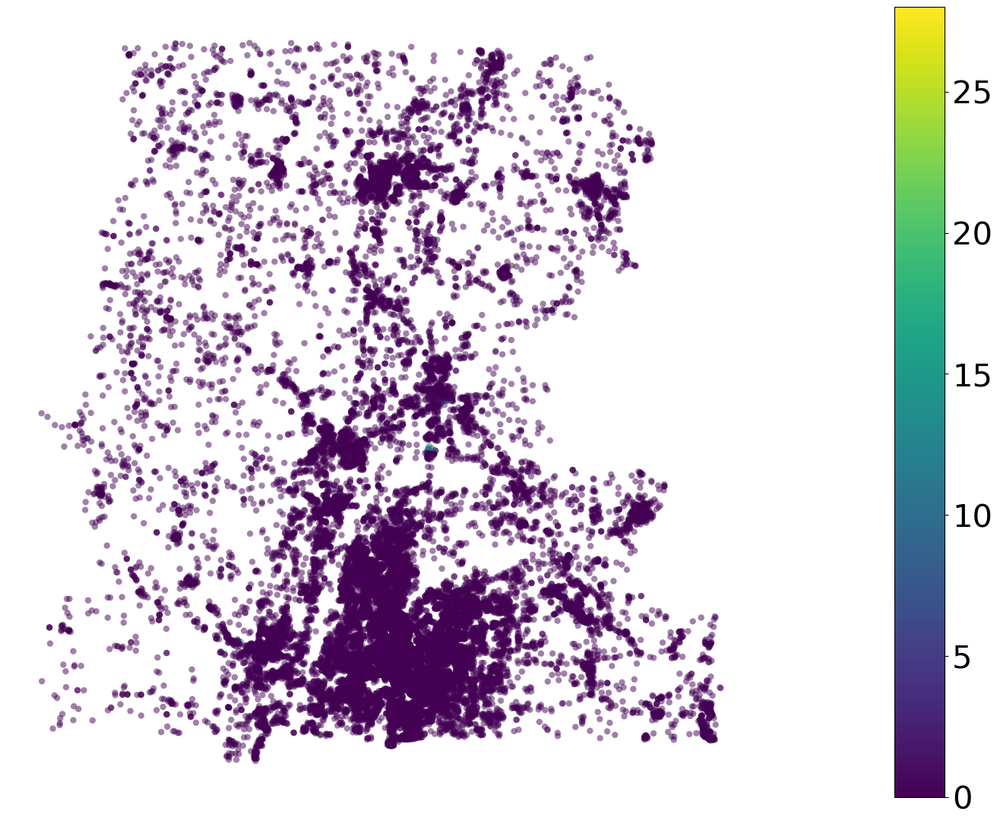

In [54]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('weighted_degree_education', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-education-equity-weighted-node-degree.png',dpi=120)

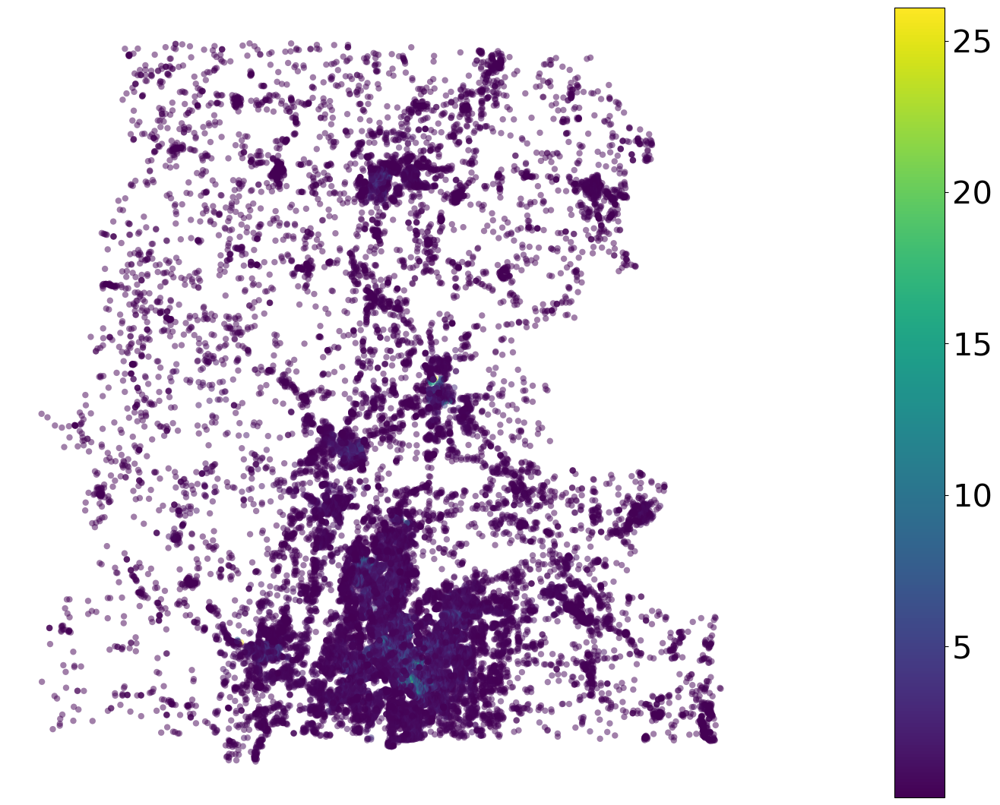

In [55]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('weighted_degree_income_popdens_education', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-income-popden-education-equity-weighted-node-degree.png',dpi=120)

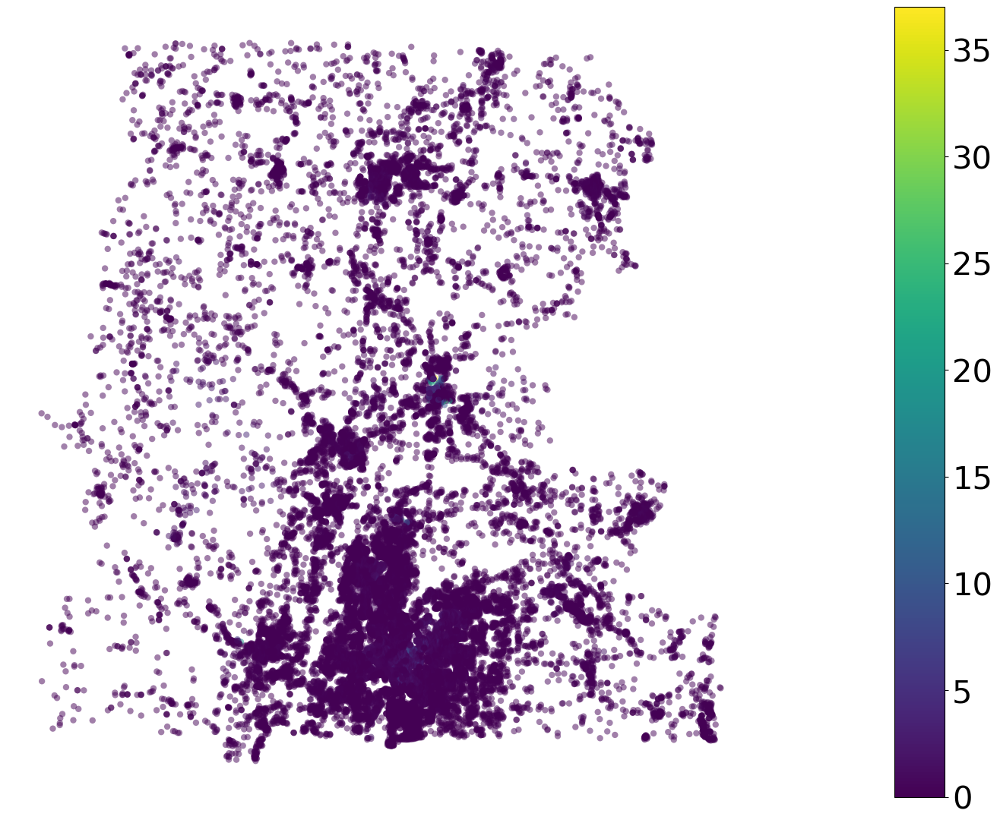

In [56]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('weighted_overlapping_degree_income', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-income-equity-weighted-node-overlapping-degree.png',dpi=120)

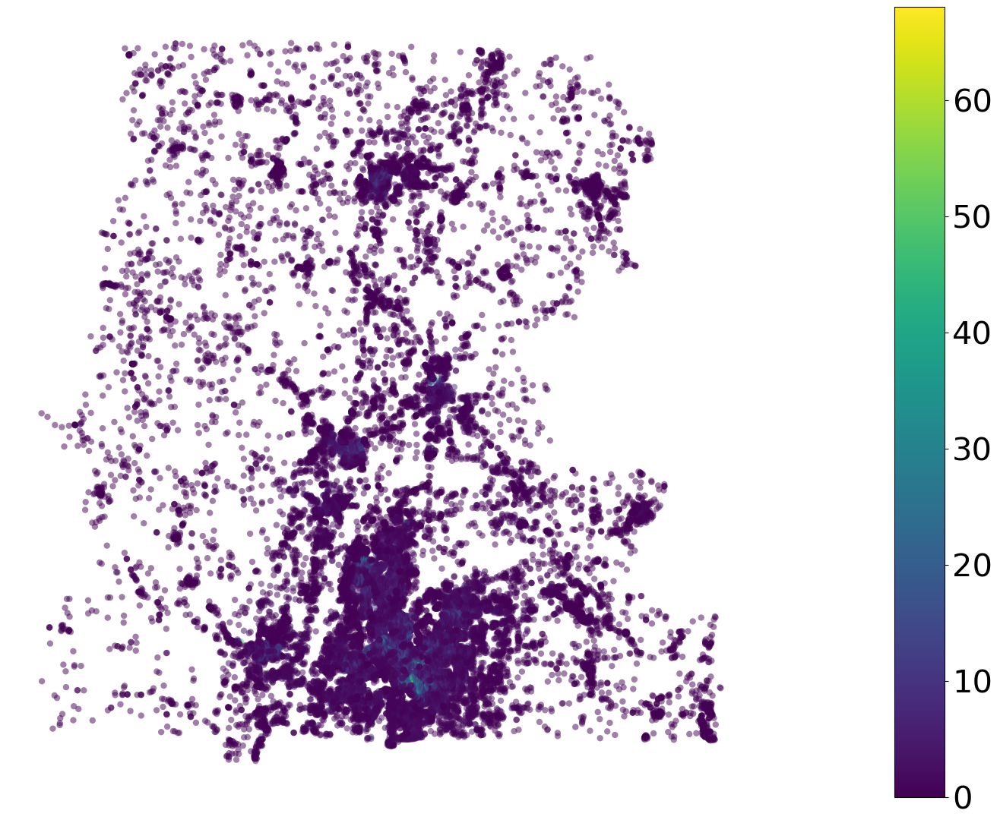

In [57]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('weighted_overlapping_degree_popden', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-popden-equity-weighted-node-overlapping-degree.png',dpi=120)

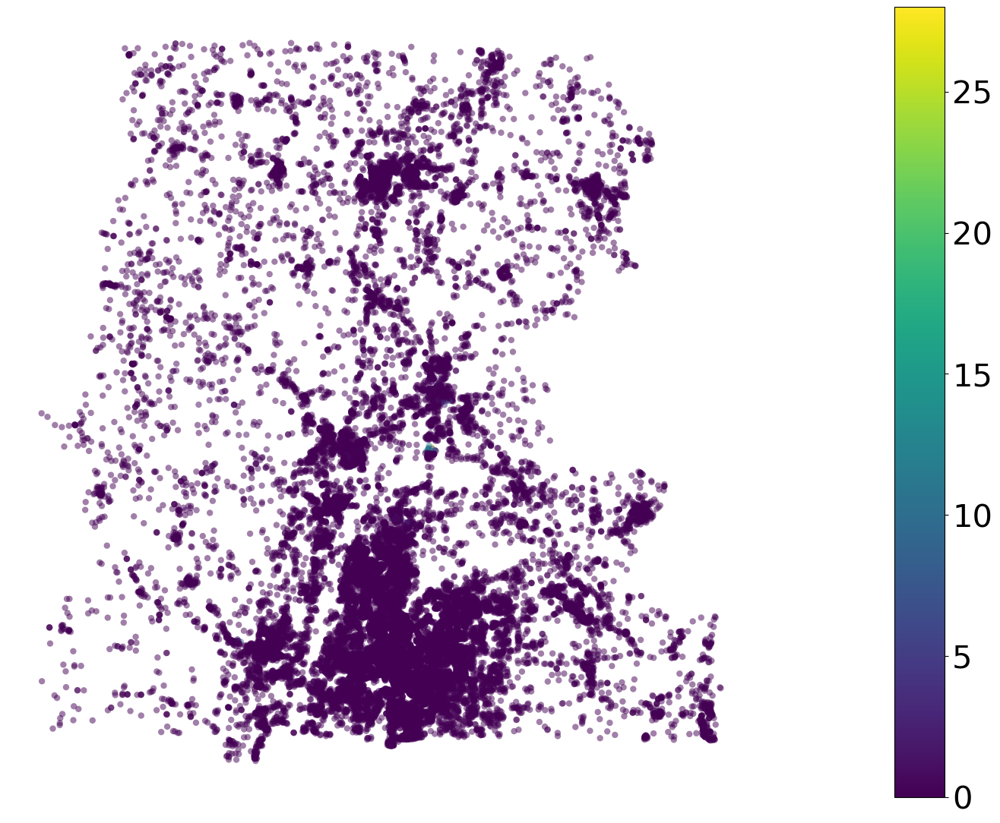

In [58]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('weighted_overlapping_degree_education', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-edcucation-equity-weighted-node-overlapping-degree.png',dpi=120)

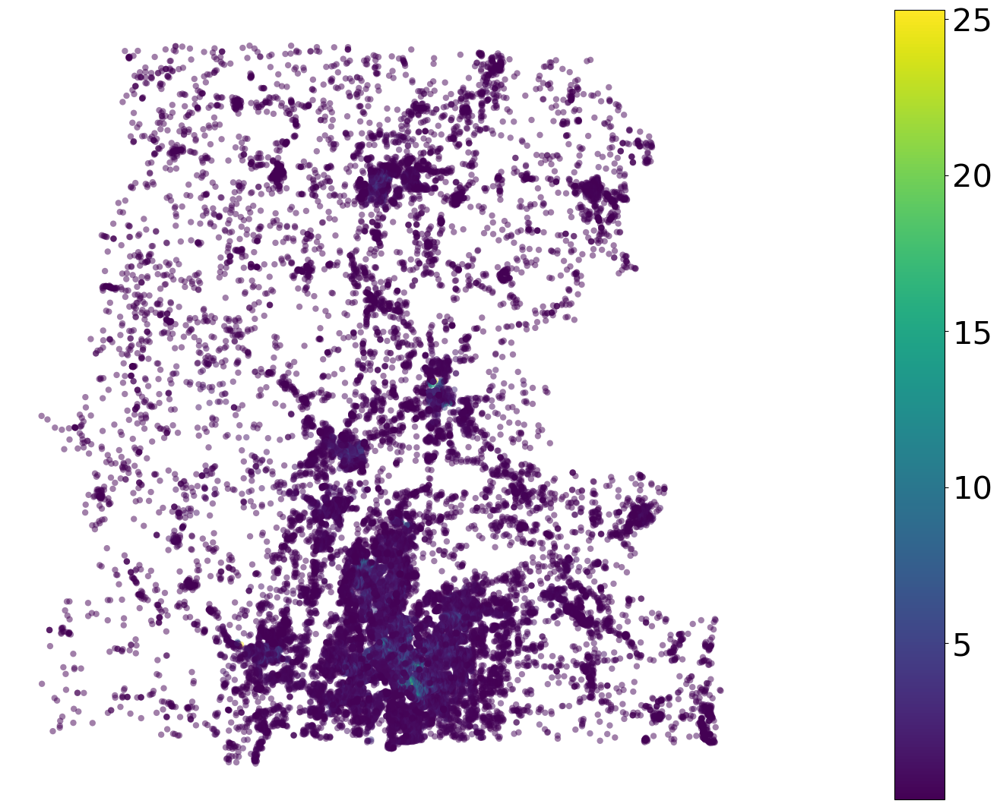

In [59]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('weighted_overlapping_degree_income_popdens_education', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-income-popden-education-equity-weighted-node-overlapping-degree.png',dpi=120)

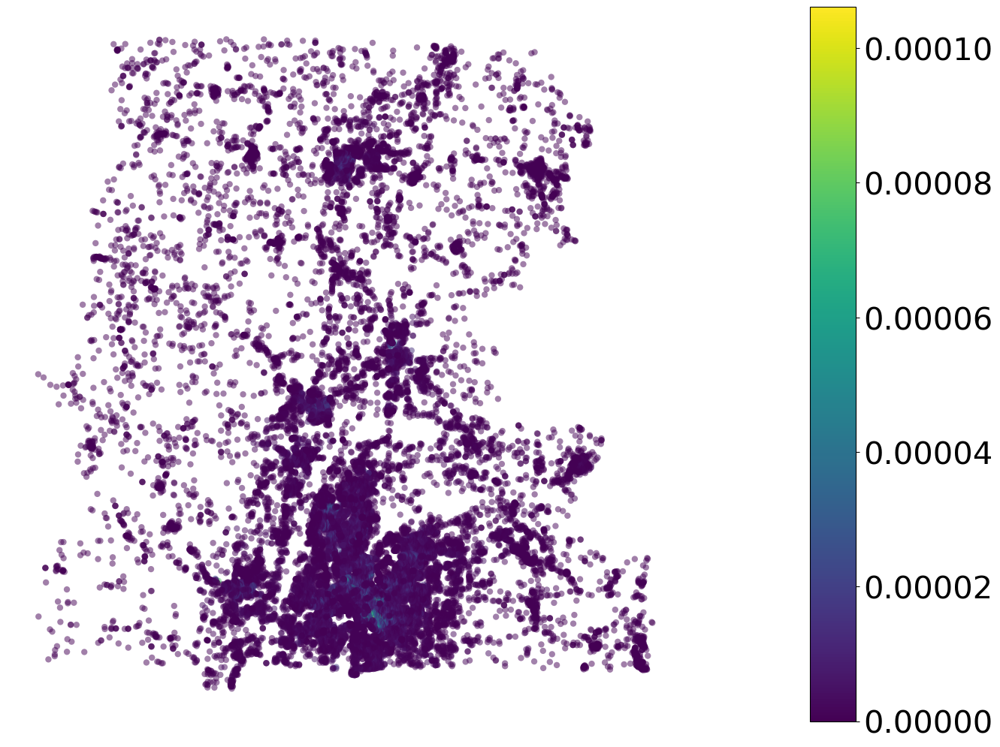

In [60]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('weighted_pagerank_popden', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-income-equity-weighted-node-pagerank.png',dpi=120)

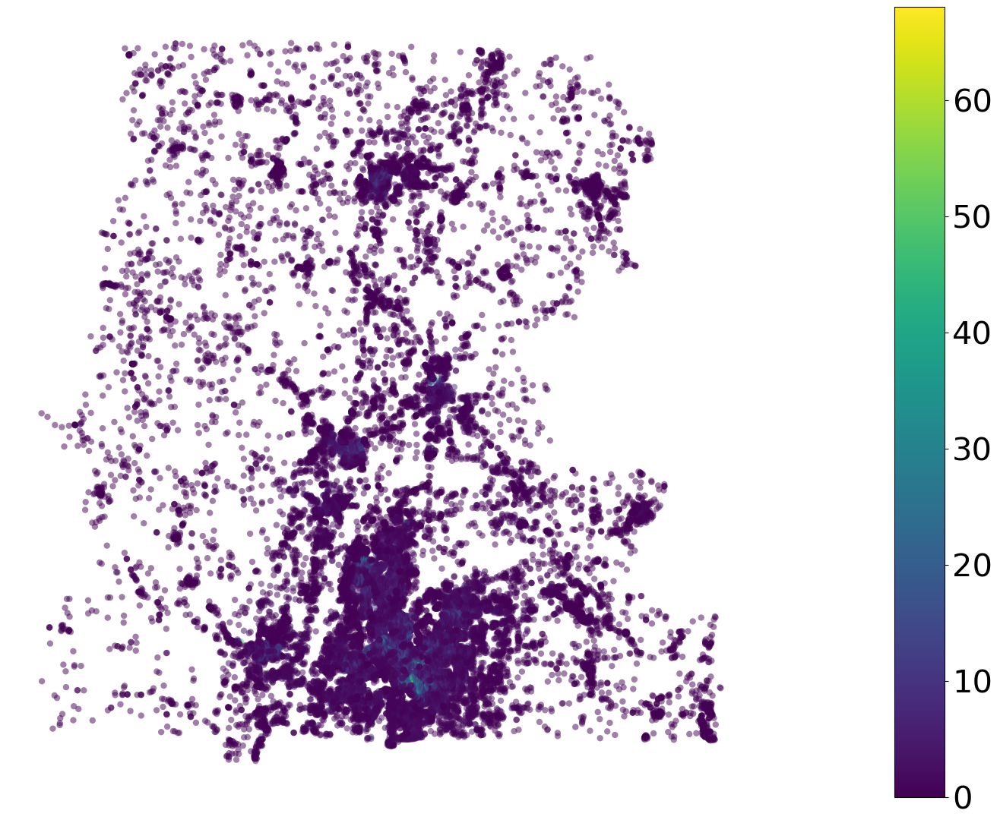

In [61]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('weighted_overlapping_degree_popden', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-popden-equity-weighted-node-pagerank.png',dpi=120)

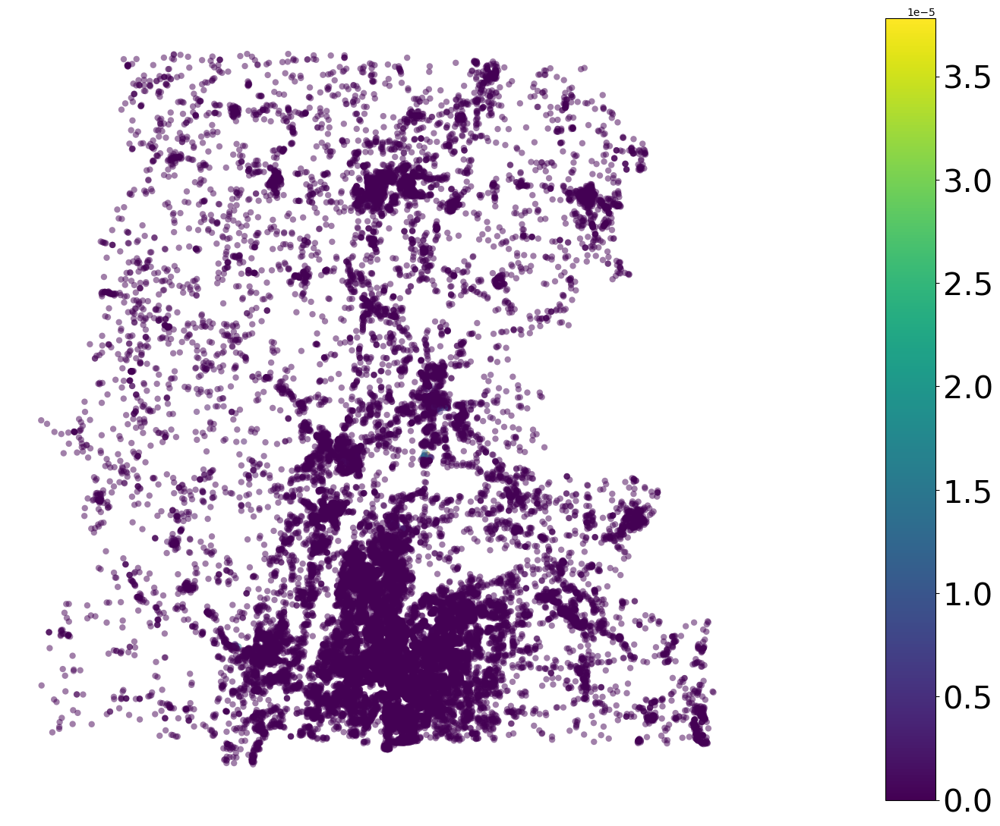

In [62]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('weighted_pagerank_education', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-edcucation-equity-weighted-node-pagerank.png',dpi=120)

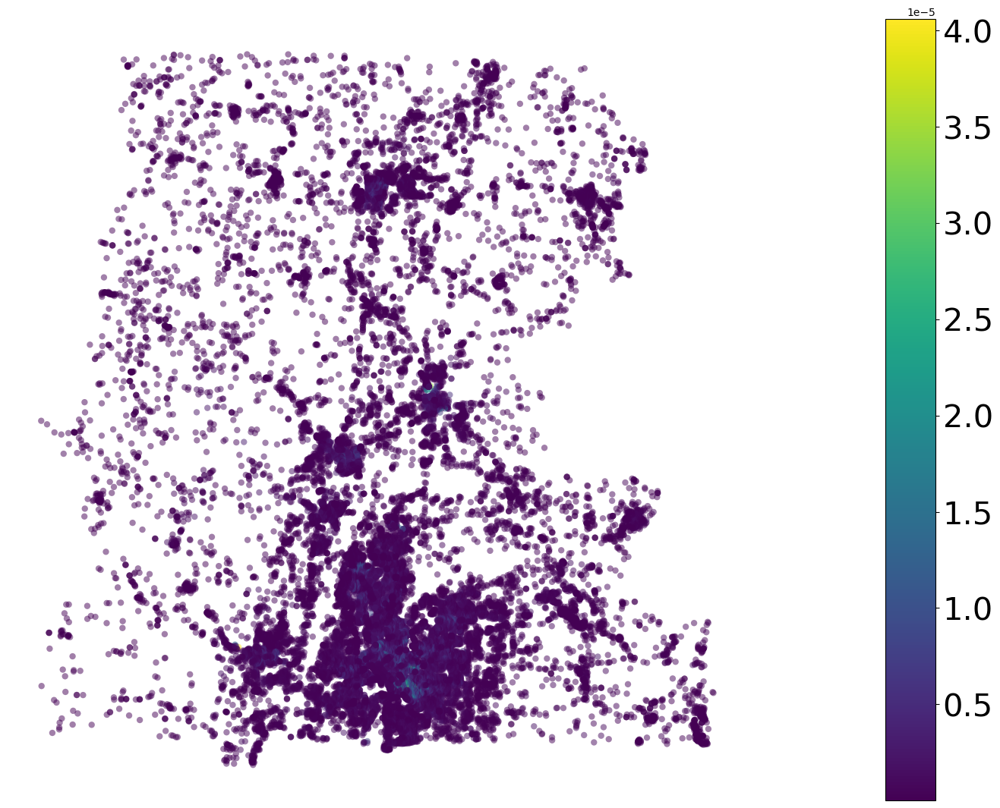

In [63]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('weighted_pagerank_income_popdens_education', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-income-popden-education-equity-weighted-node-pagerank.png',dpi=120)

In [64]:
### Merge all resilience metrics together
merged_pv_nodes['combined_res_metric']=0.33333333333*merged_pv_nodes['weighted_degree_income_popdens_education']+0.33333333333*merged_pv_nodes['weighted_overlapping_degree_income_popdens_education']+0.33333333333*merged_pv_nodes['weighted_pagerank_income_popdens_education']

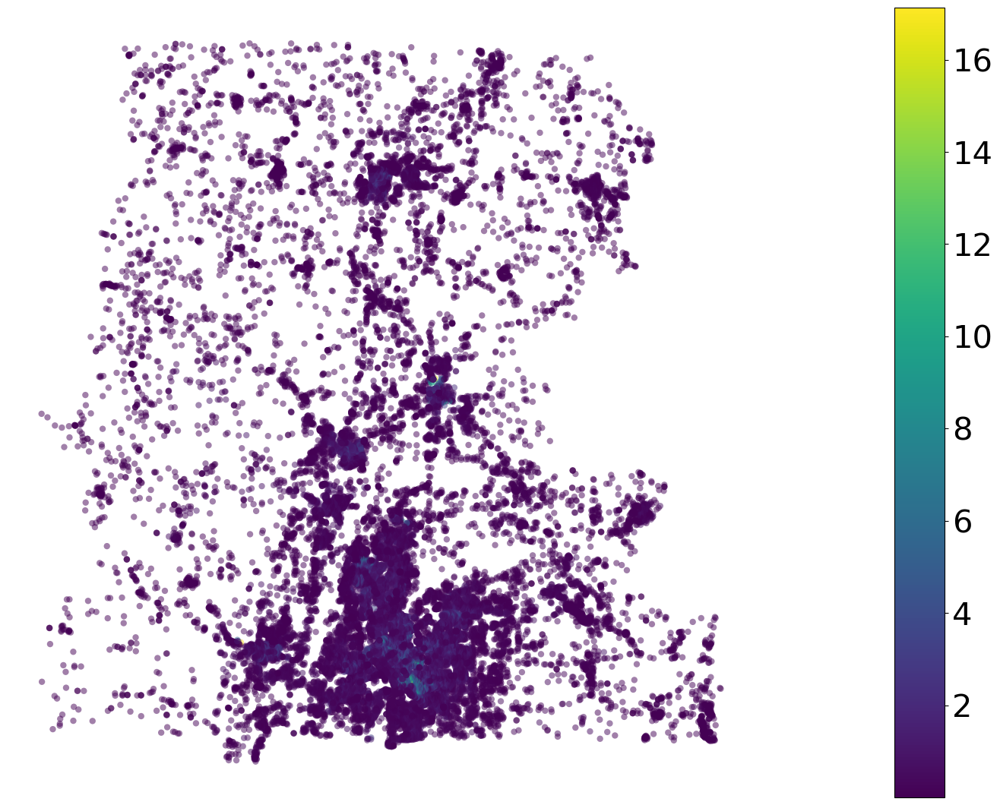

In [65]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
merged_pv_nodes.plot('combined_res_metric', cmap='viridis', alpha=.5, ax=ax, linewidth=.25, edgecolor='None',legend=True, cax=cax)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Terrain, crs=merged_pv_nodes.crs)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('ML-pv-combined_res_metric.png',dpi=120)

In [66]:
sorted_nodes = merged_pv_nodes.sort_values(by='combined_res_metric', ascending=False)

# Selecting the top N critical nodes for analysis and visualization
N = 1000  # or any other number you prefer
critical_nodes = sorted_nodes.head(N)

# Extracting city, tract, and other relevant information
critical_nodes_info = critical_nodes[['id', 'GEOID', 'geometry', 'combined_res_metric']]

critical_nodes_info

,id,GEOID,geometry,combined_res_metric
6955,71854240,25013812903,POINT (-72.78902 42.13011),17.130319
587,66661136,25015820400,POINT (-72.52451 42.39598),16.094682
23000,70177220,25013802300,POINT (-72.54776 42.09062),15.855196
23402,70039096,25013802300,POINT (-72.55940 42.09018),15.388866
23510,70197035,25013802300,POINT (-72.56178 42.09420),11.658232
...,...,...,...,...
1214,70184907,25013801300,POINT (-72.56754 42.11885),2.671774
1604,68707725,25015821904,POINT (-72.62522 42.32300),2.668262
15803,64745196,25013811301,POINT (-72.57971 42.18756),2.662001
21863,70004342,25013801503,POINT (-72.50915 42.13461),2.658422


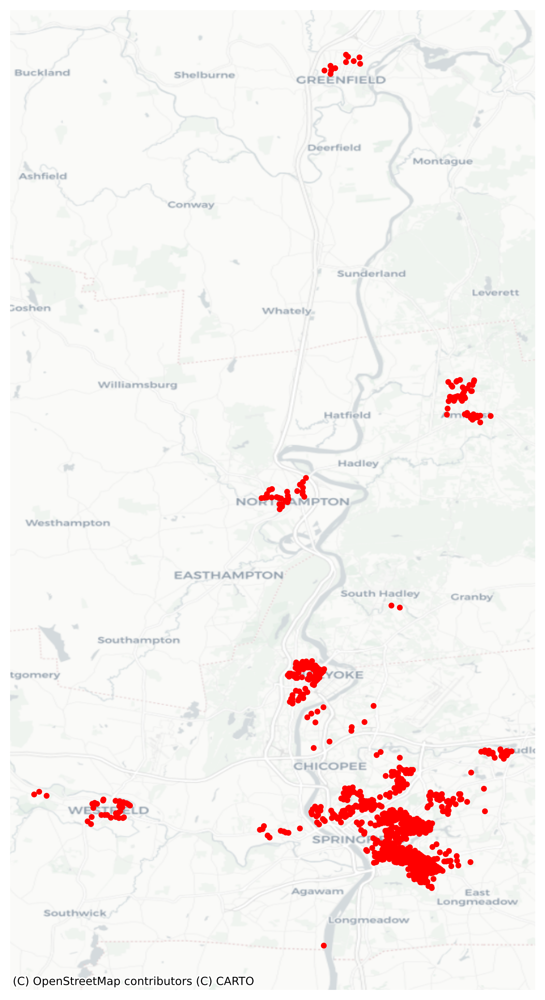

In [70]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)

# Plot all nodes for context in gray
#merged_pv_nodes.plot(ax=ax, color='gray', markersize=0.5, alpha=0.5)  # Adjust alpha for transparency

# Plot critical nodes in red without annotations
critical_nodes.plot(ax=ax, color='red', markersize=10)

# Adding a more visible base map using CartoDB.Positron
ctx.add_basemap(ax, crs=merged_pv_nodes.crs.to_string(), source=ctx.providers.CartoDB.Positron)

# Adjust the view to the extent of your data (optional, for better focusing on your area of interest)
#ax.set_xlim(merged_pv_nodes.total_bounds[[0, 2]])
#ax.set_ylim(merged_pv_nodes.total_bounds[[1, 3]])

# Remove axis clutter
ax.axis('off')
plt.tight_layout()

plt.savefig('ML-pv-critical nodes.png',dpi=120)
plt.show()


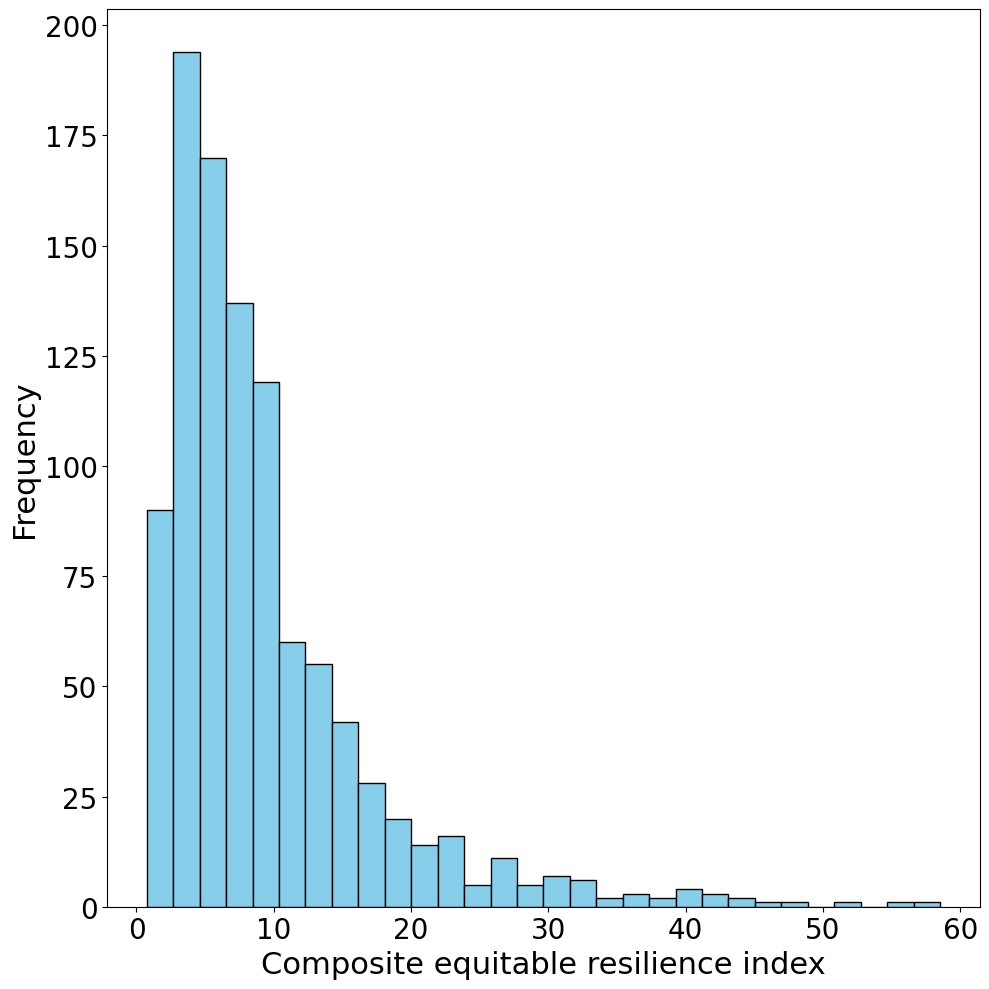

In [71]:
import matplotlib.pyplot as plt
import numpy as np

# Simulating merged_pv_nodes['combined_res_metric'] with random data for the example
np.random.seed(0)
combined_res_metric = np.random.lognormal(mean=2, sigma=0.75, size=1000)

# Creating the histogram
plt.figure(figsize=(10, 10))
plt.hist(combined_res_metric, bins=30, color='skyblue', edgecolor='black')
plt.xlabel('Composite equitable resilience index', fontsize=22)
plt.ylabel('Frequency', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.tight_layout()
plt.savefig('hist-ML-pv-holistic-resilience.png',dpi=500)
plt.show()